<a href="https://colab.research.google.com/github/ShriMLEngineer/furniture_classification/blob/main/model_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# clone git repository

Delete reporCheck if already cloned

In [ ]:
import shutil
try:
  shutil.rmtree("/content/furniture_classification/outputs")
  shutil.rmtree("/content/furniture_classification/detr-main/detr_r50_no-class-head.pth")
  print("folder found and deleted")
except:
  print("folder not found")

In [1]:
!git clone https://github.com/ShriMLEngineer/furniture_classification

Cloning into 'furniture_classification'...
remote: Enumerating objects: 425, done.
remote: Counting objects: 100% (114/114), done.
remote: Compressing objects: 100% (104/104), done.
remote: Total 425 (delta 24), reused 79 (delta 7), pack-reused 311
Receiving objects: 100% (425/425), 121.61 MiB | 21.26 MiB/s, done.
Resolving deltas: 100% (27/27), done.
Updating files: 100% (348/348), done.


In [3]:
import shutil
try:
  shutil.rmtree("/content/furniture_classification/outputs")
  print("folder found and deleted")
except:
  print("folder not found")

folder found and deleted


In [4]:
cd /content/furniture_classification/detr-main

/content/furniture_classification/detr-main


# Delete class heads so that pretrained weights can be used to train just head

In [5]:
import torch
checkpoint = torch.hub.load_state_dict_from_url(
            url="https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth", map_location="cpu", check_hash=True
        )
del checkpoint["model"]["class_embed.weight"]
del checkpoint["model"]["class_embed.bias"]
torch.save(checkpoint,"detr_r50_no-class-head.pth")




Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


  0%|          | 0.00/159M [00:00<?, ?B/s]

# Model training with pretrained headless weight

In [6]:
!python main.py \
  --coco_path "/content/furniture_classification/Dataset" \
  --output_dir "/content/furniture_classification/outputs" \
  --resume "/content/furniture_classification/detr-main/detr_r50_no-class-head.pth" \
  --num_classes=4 \
  --epochs=20 \
  --lr=1e-4 \
  --batch_size=1 \
  --num_workers=1

Not using distributed mode
git:
  sha: f9565f781adb970dd8a002dcdef0272a7359a46f, status: has uncommited changes, branch: main

Namespace(aux_loss=True, backbone='resnet50', batch_size=1, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/furniture_classification/Dataset', dataset_file='coco', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=20, eval=False, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_classes=4, num_queries=100, num_workers=1, output_dir='/content/furniture_classification/outputs', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/content/furniture_classification/detr-main/detr_r50_no-class-head.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, w

# Plot the graphs of  mAP, Loss and Class error

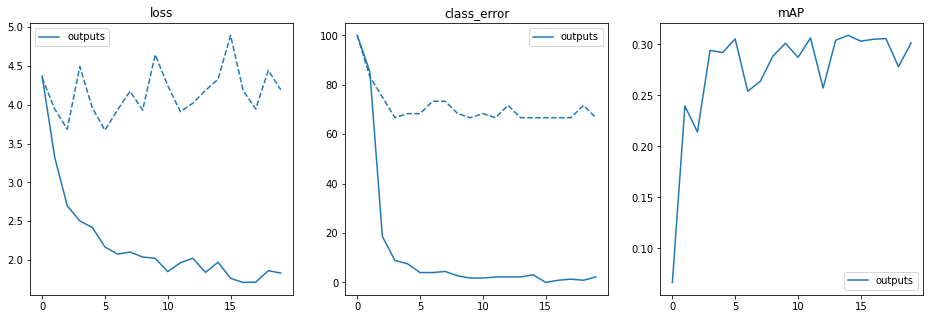

In [7]:
from util.plot_utils import plot_logs

from pathlib import Path

log_directory = [Path('/content/furniture_classification/outputs')]

fields_of_interest = (
    'loss','class_error','mAP'
  )

plot_logs(log_directory, fields_of_interest)

# Inference the model to try on few test images

In [8]:
import math

from PIL import Image
import requests
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import ipywidgets as widgets
from IPython.display import display, clear_output

import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as T
torch.set_grad_enabled(False);
import os

set 4 classes - 3 classes as per the input data classes and 1 as No-Class

In [9]:
# COCO classes
CLASSES = [
    'N/A', 'Bed', 'Chair', 'Sofa'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [10]:
# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [11]:
def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [12]:
path = '/content/furniture_classification/detr-main'

model = torch.hub.load(path, 'detr_resnet50', source="local", pretrained=True, num_classes=4)
checkpoint = torch.load("/content/furniture_classification/outputs/checkpoint.pth", map_location='cpu')

model.load_state_dict(checkpoint['model'], strict=False)
model.eval();

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Run the trained model on 15 images that were not part of training

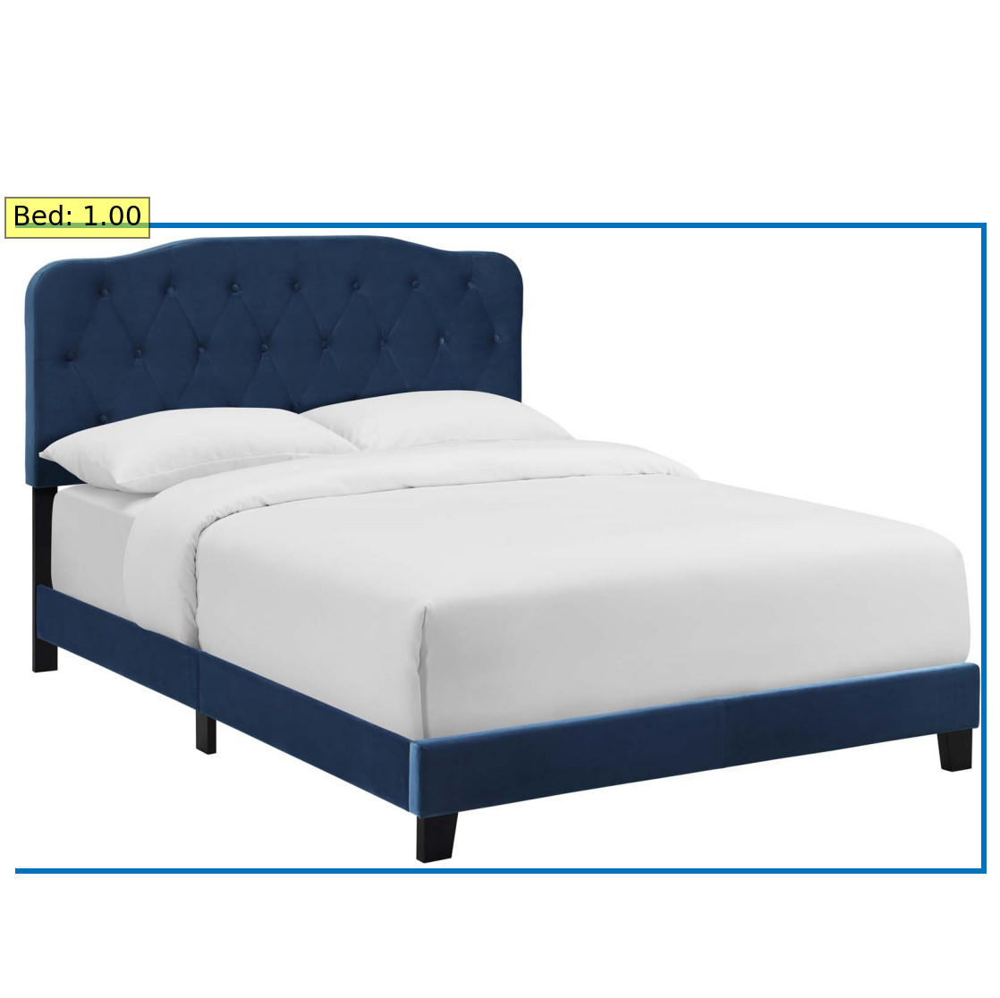

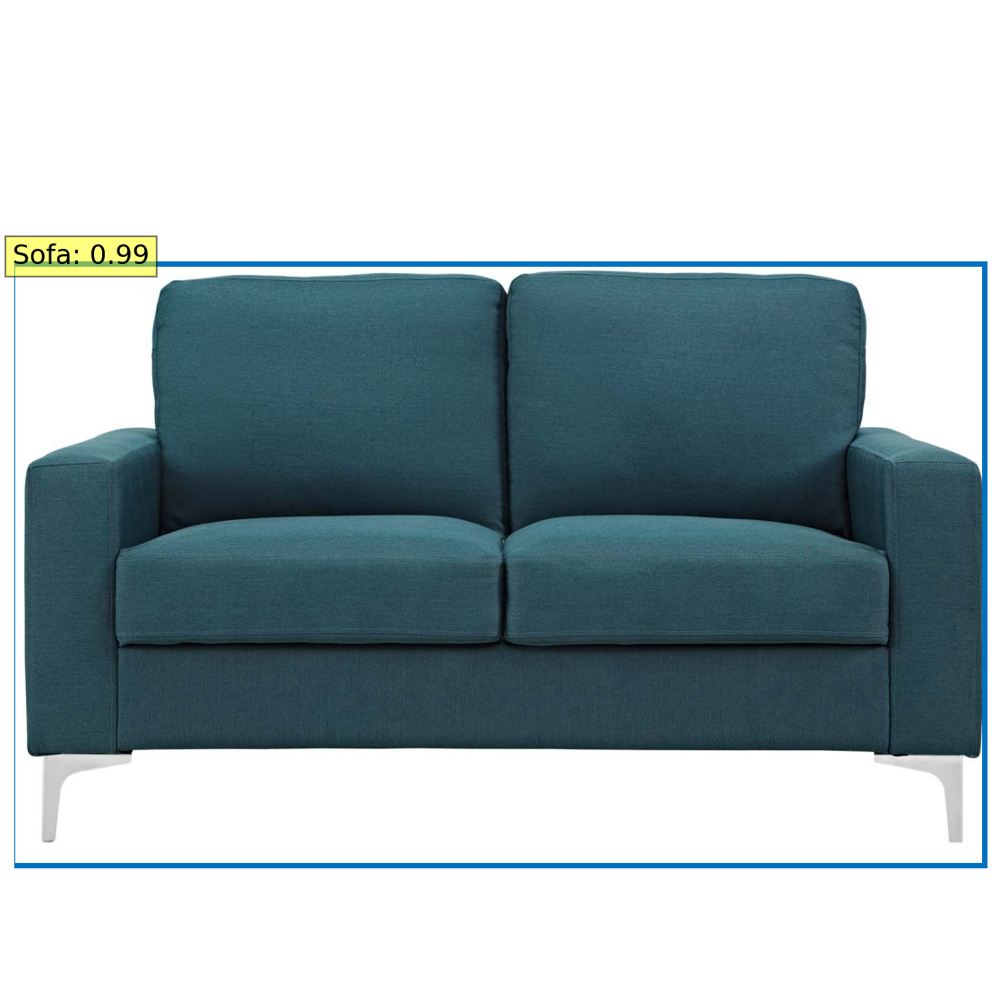

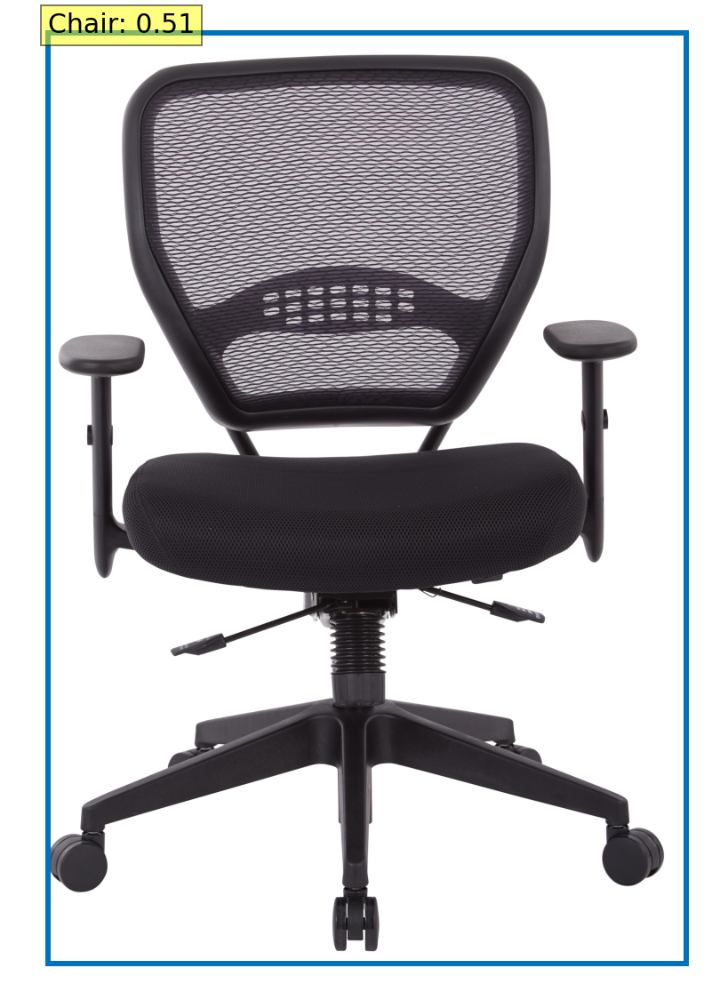

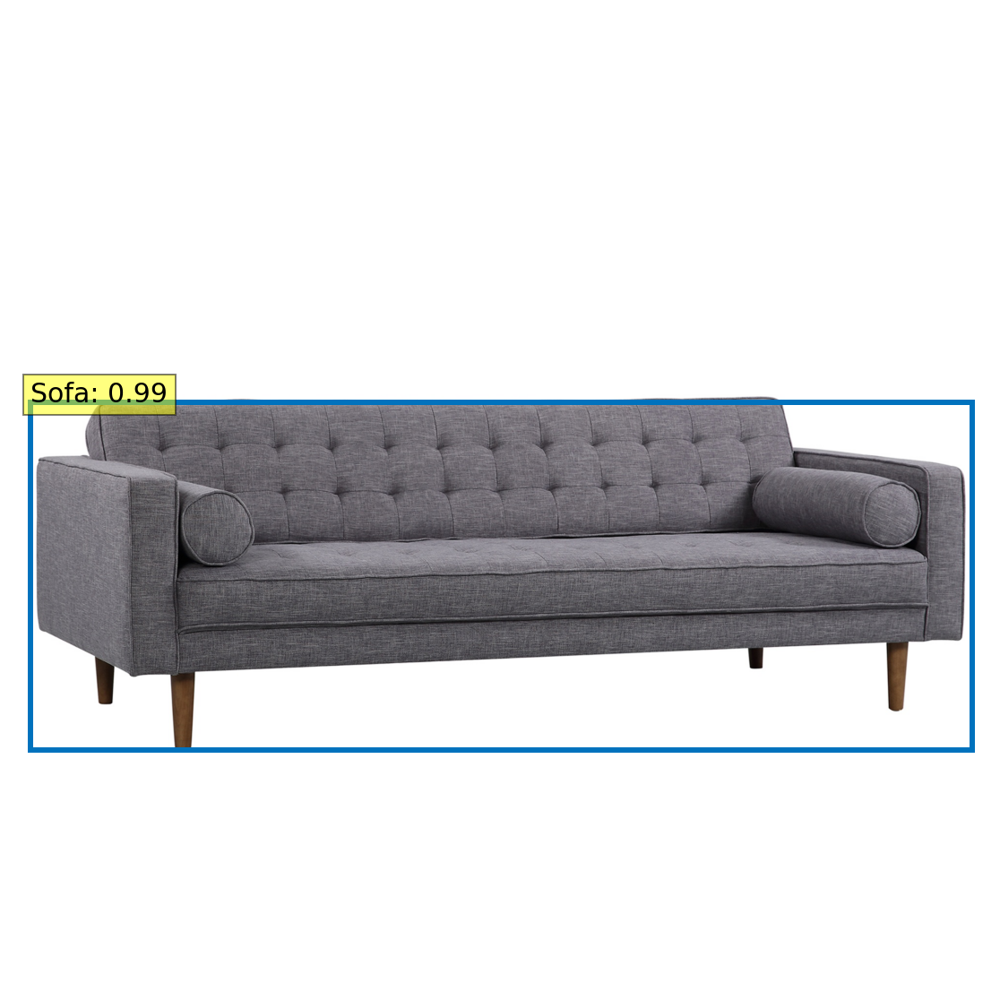

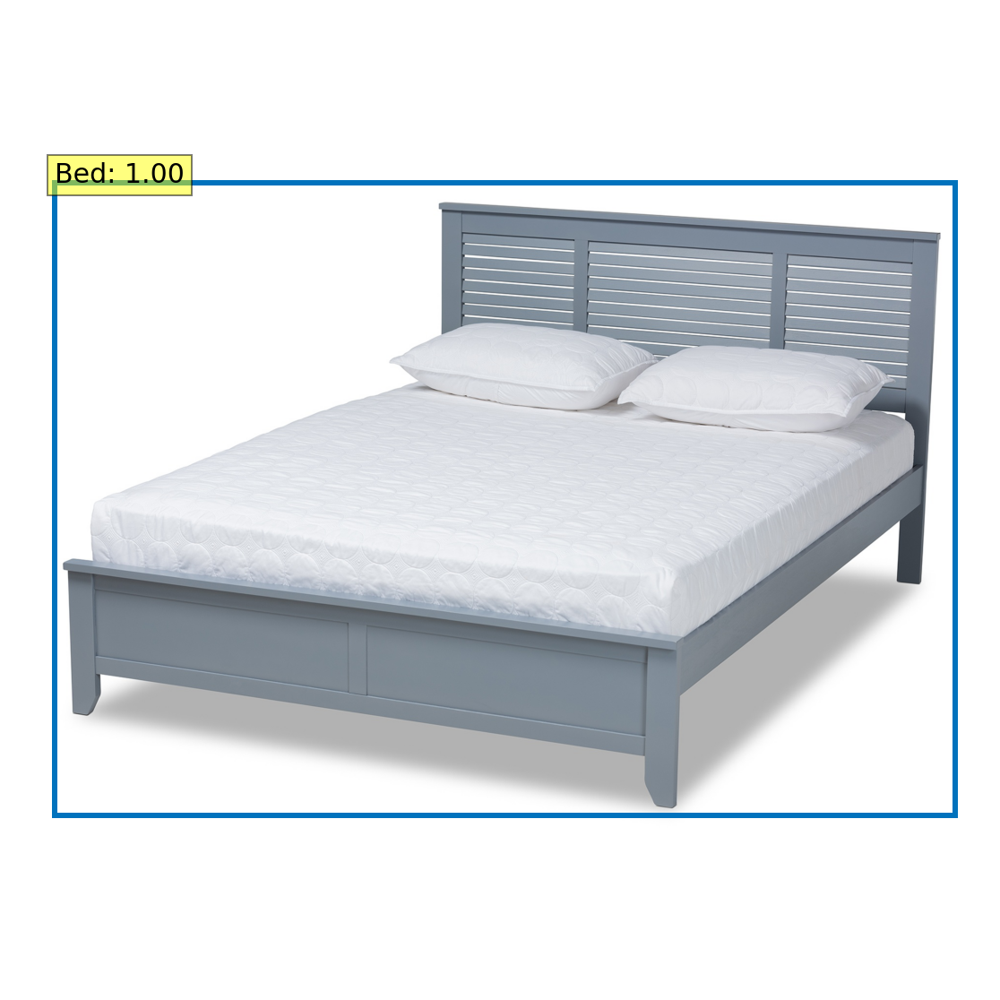

...

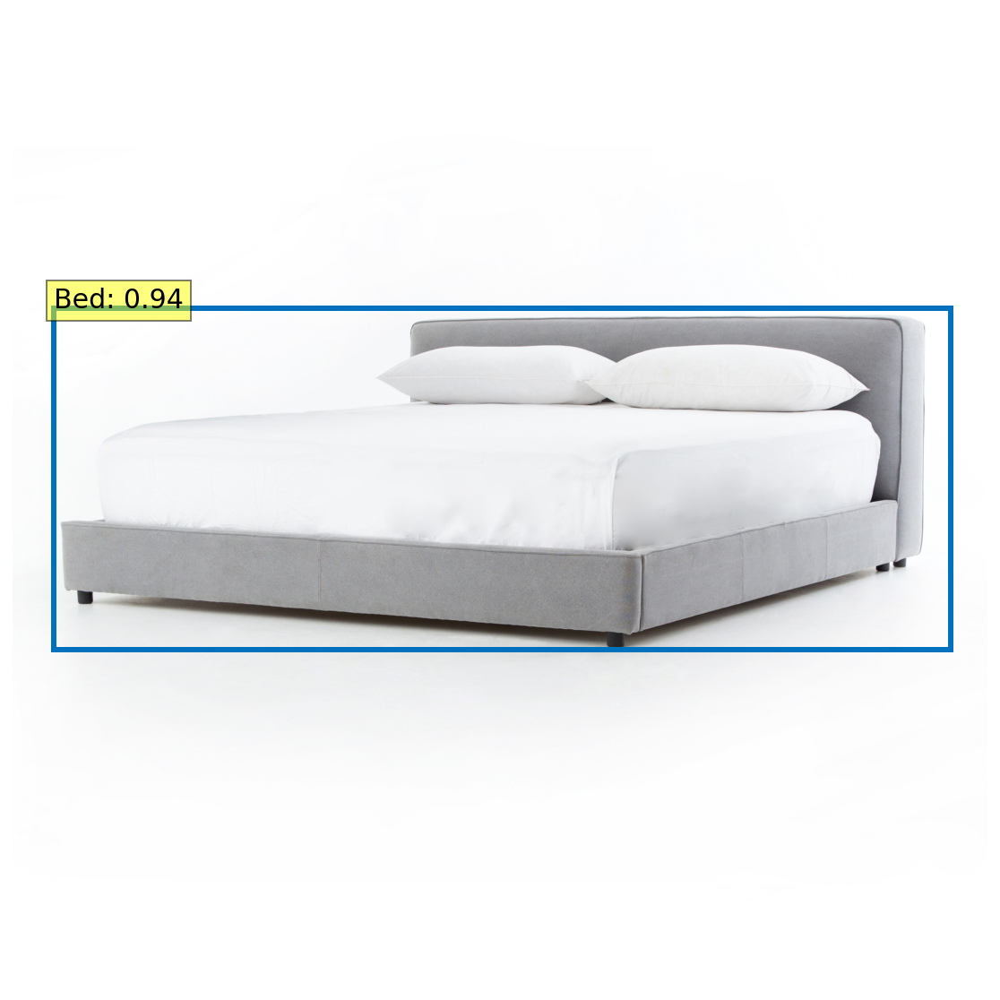

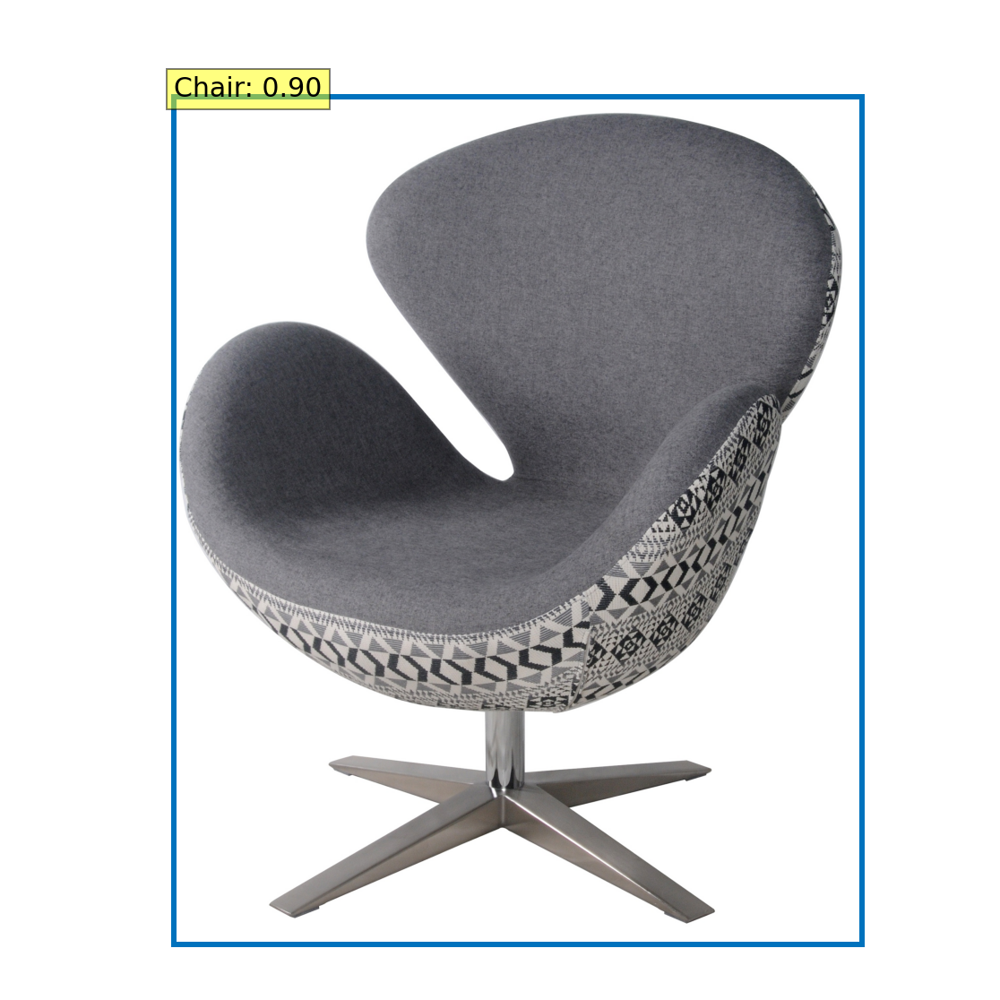

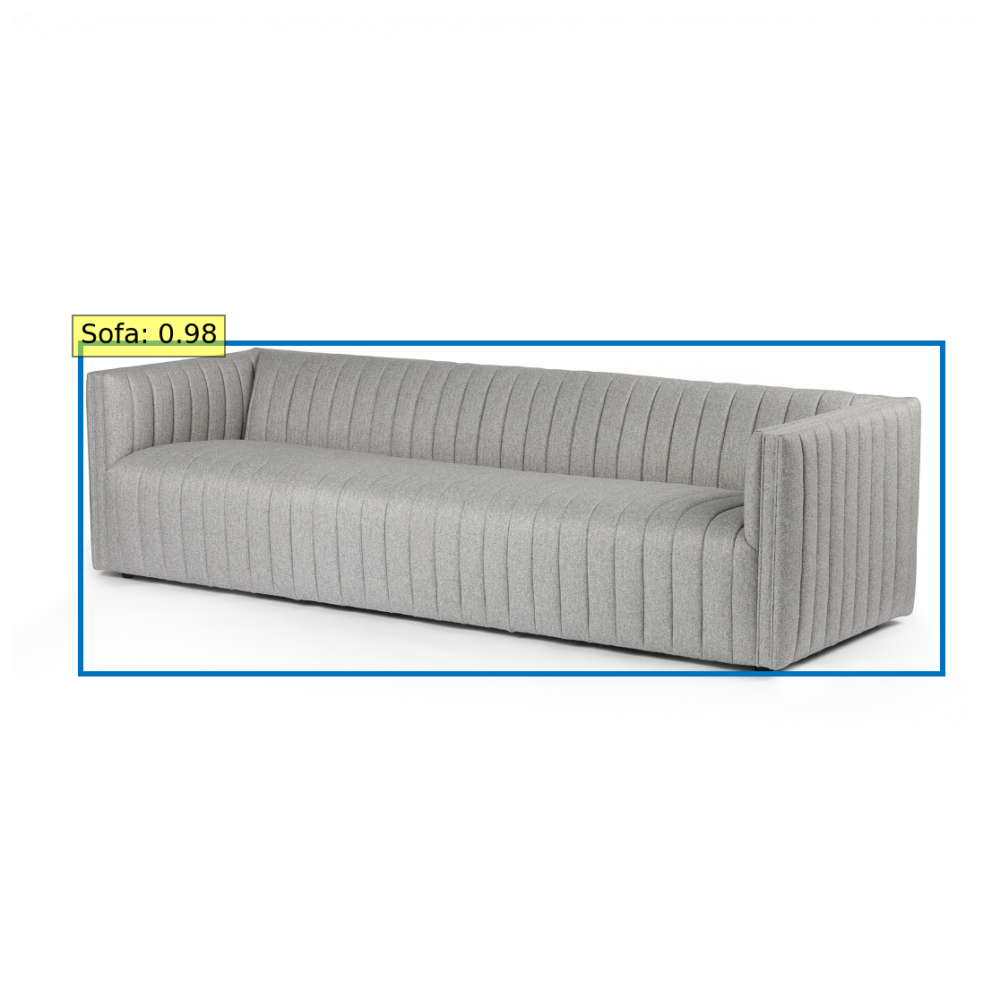

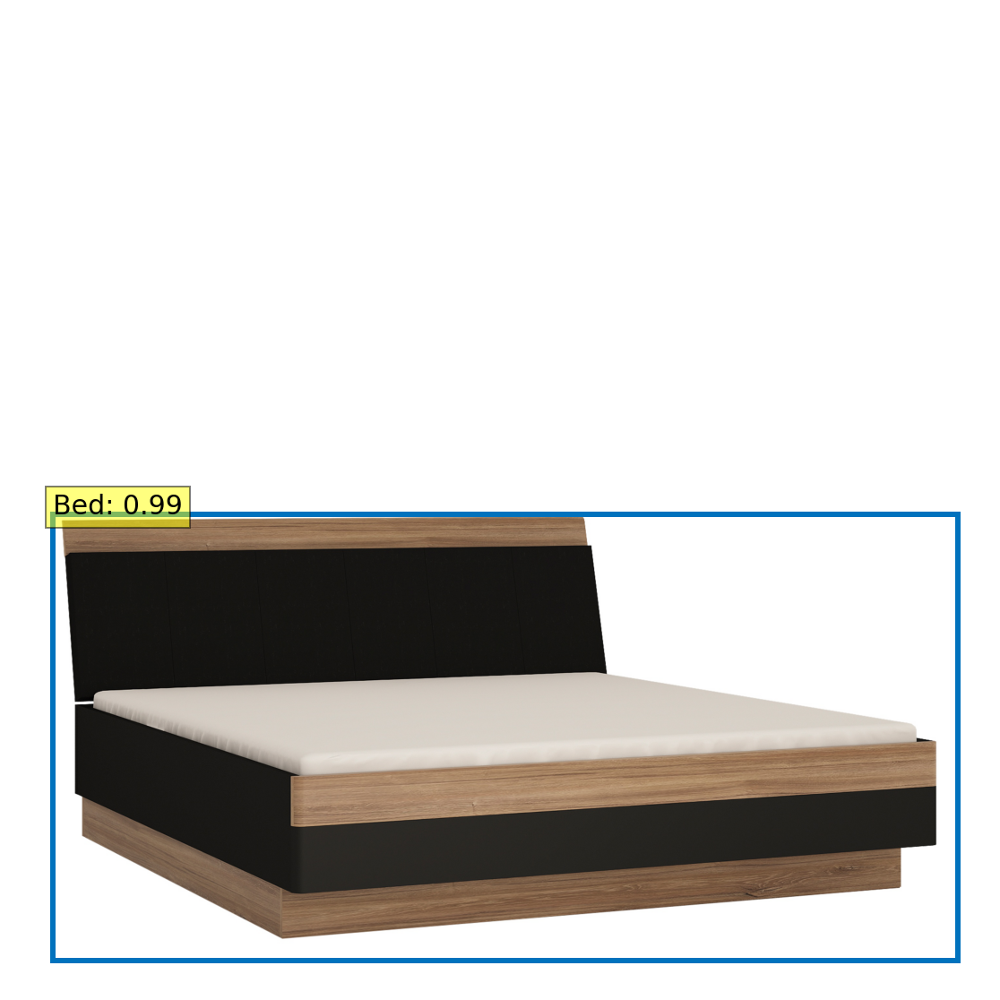

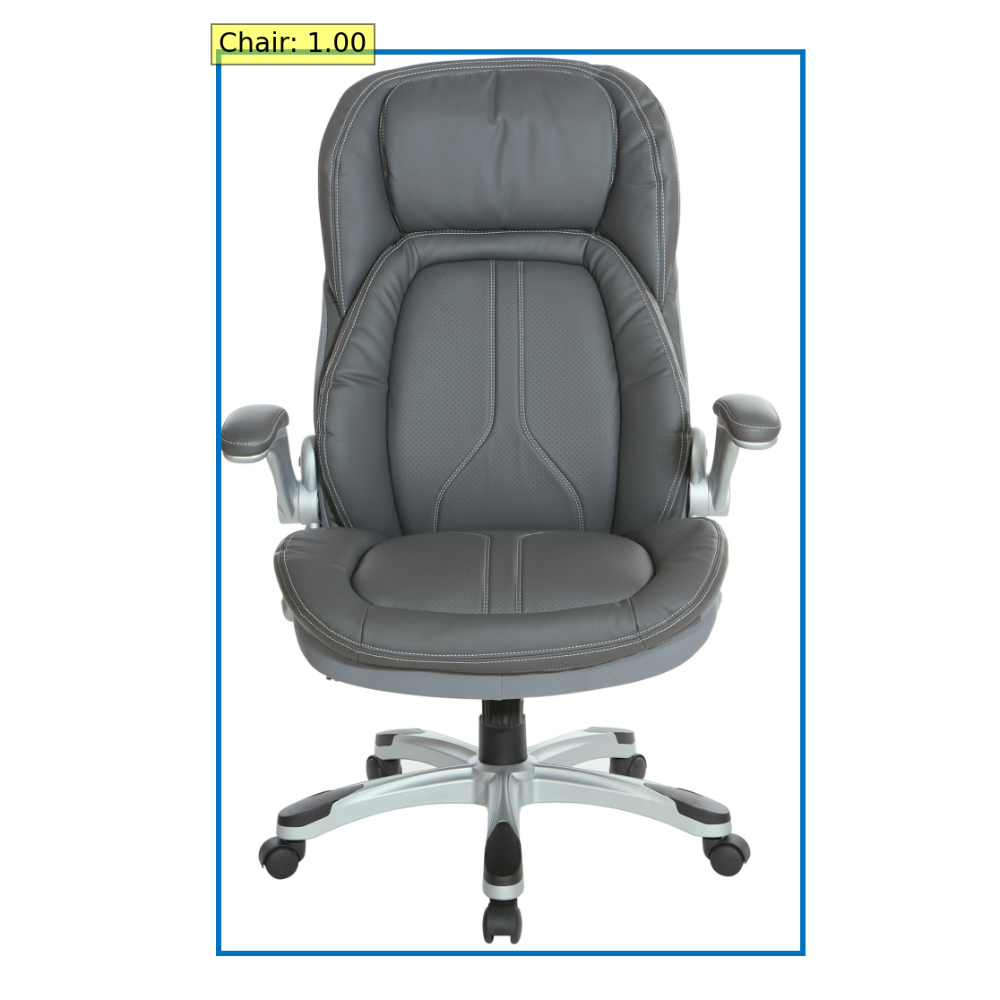

In [13]:

test_image_dir = "/content/furniture_classification/Dataset/Model Testing image"

for i, image_filename in enumerate(os.listdir(test_image_dir)):
  image_path = os.path.join(test_image_dir, image_filename)
  im = Image.open(image_path)

  # mean-std normalize the input image (batch-size: 1)
  img = transform(im).unsqueeze(0)

  # propagate through the model
  outputs = model(img)

  # keep only predictions with 0.7+ confidence
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > 0.2

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

  plot_results(im, probas[keep], bboxes_scaled)
